In [2]:
#pip install shapely

강남구내에 램덤으로 위경도를 찍기 위해 폴리곤 바운더리를 이용하여 램덤좌표 찍기

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import koreanize_matplotlib
from sklearn.cluster import KMeans
import numpy as np
from haversine import haversine
from shapely.geometry import Point
from shapely.geometry.polygon import Polygon

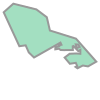

In [2]:
polylist = [
    (127.0158715456462, 37.52395552514407), \
    (127.03404427570877, 37.48455972739361), \
    (127.04138283634332, 37.48556651426365), \
    (127.04501866584928, 37.47730743834274), \
    (127.05109704553787, 37.47143038122402), \
    (127.08181938718701, 37.488766534231814), \
    (127.0829699570822, 37.486260930171355), \
    (127.07976935335684, 37.48555133810168), \
    (127.08025449404848, 37.48456891064258), \
    (127.07596786895694, 37.48317518162543), \
    (127.07585253680503, 37.48093174415405), \
    (127.08014959673851, 37.481631694208154), \
    (127.08196827786045, 37.48015279205741), \
    (127.08589130090392, 37.480023864131155), \
    (127.09622503041525, 37.48009699103141), \
    (127.09607233059212, 37.484457996448725), \
    (127.0968868132337, 37.484772684201445), \
    (127.09785785720334, 37.48375374466706), \
    (127.10049344132076, 37.48462551028881), \
    (127.09964813686373, 37.48665349416874), \
    (127.10261025731748, 37.486434716842325), \
    (127.10411019888349, 37.48364027975824), \
    (127.09961923020603, 37.48191421556131), \
    (127.10257722231188, 37.4788122144288), \
    (127.10497607049953, 37.48026073177465), \
    (127.10492453516474, 37.475746721996316), \
    (127.10001850811862, 37.47610237034757), \
    (127.09248874886488, 37.47578414076369), \
    (127.08669531549697, 37.47135556484104), \
    (127.09276829953566, 37.46414286714414), \
    (127.09964233625507, 37.46525452474618), \
    (127.1012649179668, 37.461432857267), \
    (127.09940991577305, 37.460461339593685), \
    (127.10162320409935, 37.45890971654731), \
    (127.10782171773475, 37.46211182557879), \
    (127.11387871956023, 37.461097011051415), \
    (127.1234727951866, 37.46660156429503), \
    (127.09986054922331, 37.49332977890127), \
    (127.06956401375487, 37.50279404849988), \
    (127.06595858545498, 37.51822131133216), \
    (127.05383896278687, 37.52730956318118), \
    (127.02705198082393, 37.53395010704315)]
polygon = Polygon(polylist)
polygon

In [3]:
lat = []
lng = []
for pol in polylist:
    lat.append(pol[1])
    lng.append(pol[0])

In [4]:
max(lat), min(lat)

(37.53395010704315, 37.45890971654731)

In [5]:
max(lng), min(lng)

(127.1234727951866, 127.0158715456462)

In [6]:
import random

def generate_random_numbers(min_value, max_value, num_samples):
    random_numbers = []
    for _ in range(num_samples):
        random_numbers.append(random.uniform(min_value, max_value))
    return random_numbers

lat_range = generate_random_numbers(37.45901355607214, 37.53719881898076, 2500)
lng_range = generate_random_numbers(127.0088013935976, 127.12288623841854, 2500)
test = pd.DataFrame({'lat': lat_range, 'lng':lng_range})

In [7]:
test = pd.DataFrame({'lat': lat_range, 'lng':lng_range})

In [8]:
# 랜덤좌표 바운더리 안에 드는것만 정리
test['inside'] = test.apply(lambda x: polygon.contains(Point(x['lng'], x['lat'])), axis=1)
test = test[test['inside']==True]
test

,lat,lng,inside
2,37.510895,127.065087,True
5,37.488063,127.086883,True
6,37.498358,127.047600,True
8,37.488282,127.049501,True
9,37.499430,127.075837,True
...,...,...,...
2482,37.464192,127.103828,True
2483,37.483788,127.088313,True
2488,37.481866,127.065237,True
2493,37.532981,127.026773,True


In [9]:
# 랜덤좌표들 지도에 찍어보기 > 분류가 나름 잘된것같다
import folium
import json
from folium import Marker
geo_path = '../data/서울_자치구_경계_2017.geojson'
geo_str = json.load(open(geo_path, encoding='utf-8'))

m = folium.Map(location=[37.4966, 127.0628], zoom_start=13)
m.choropleth(geo_data=geo_str, fill_color='#bdbbbb')

for idx, row in test.iterrows():
    folium.Circle(
        location=[row['lat'], row['lng']],
        radius=50
    ).add_to(m)
    
m

c:\Users\Leeminji\miniconda3\envs\ds_study\lib\site-packages\folium\folium.py:465: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  warnings.warn(


시설들 데이터를 가지고 랜덤 좌표와 거리 계산

In [10]:
convenience = pd.read_csv('../data/convenience store.csv', index_col=0)
restroom = pd.read_csv('../data/gn_restroom.csv', index_col=0)
sports = pd.read_csv('../data/ARR_SPORTS.csv', index_col=0)
tour = pd.read_csv('../data/ARR_TOURISM.csv', index_col=0)
food = pd.read_csv('../data/ARR_FOOD.csv', index_col=0)
culture = pd.read_csv('../data/ARR_CULTURE.CSV', index_col=0)
hospital = pd.read_csv('../data/ARR_HOSPITAL.csv', index_col=0)
subway = pd.read_csv('../data/강남구지하철.csv', index_col=0)
subway.columns = ['subway_name', 'line', 'address', 'dong', 'lat', 'lng']

In [11]:
lists = [food, convenience, hospital, sports, tour, restroom, culture ]

In [12]:
# 랜덤 좌표를 입력하면 반경500m 주변 시설들의 갯수 구하기
within = []
for index, row in test.iterrows():
    within_500m = []
    c_lat = row['lat']
    c_lng = row['lng']
    c = (c_lat, c_lng)
    within_500m.append(c_lat)
    within_500m.append(c_lng)
    for lis in lists:
        count = 0 
        for idx, r in lis.iterrows():
            lat = r['lat']
            lng = r['lng']
            sub = (lat, lng)
    
            if haversine(c, sub, unit='m') < 500:
                count += 1
        within_500m.append(count)
    within.append(within_500m)

In [13]:
cols = ['lat', 'lng', 'food_500', 'convenience_500', 'hospital_500', 'sports_500', 'tour_500', 'restroom_500', 'culture_500']
data_500 = pd.DataFrame(within, columns=cols)
data_500

,lat,lng,food_500,convenience_500,hospital_500,sports_500,tour_500,restroom_500,culture_500
0,37.510895,127.065087,231,21,39,22,10,7,3
1,37.488063,127.086883,104,9,53,14,1,4,1
2,37.498358,127.047600,207,22,124,47,0,5,1
3,37.488282,127.049501,99,13,58,23,1,3,1
4,37.499430,127.075837,5,3,4,4,0,5,0
...,...,...,...,...,...,...,...,...,...
896,37.464192,127.103828,59,5,25,10,0,1,0
897,37.483788,127.088313,13,5,22,5,0,4,0
898,37.481866,127.065237,39,3,25,10,1,4,0
899,37.532981,127.026773,12,2,11,6,0,5,0


In [14]:
X = data_500[['food_500', 'convenience_500', 'hospital_500', 'sports_500', 'tour_500', 'restroom_500', 'culture_500']]

구한 데이터를 가지고 군집화

In [15]:
kmeans = KMeans(n_clusters=5)
kmeans.fit(X)

c:\Users\Leeminji\miniconda3\envs\ds_study\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Users\Leeminji\miniconda3\envs\ds_study\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(


KMeans(n_clusters=5)

In [16]:
predict = pd.DataFrame(kmeans.predict(X), columns=['cluster'])
df = pd.concat([X, predict], axis=1)
df.head()

,food_500,convenience_500,hospital_500,sports_500,tour_500,restroom_500,culture_500,cluster
0,231,21,39,22,10,7,3,4
1,104,9,53,14,1,4,1,1
2,207,22,124,47,0,5,1,4
3,99,13,58,23,1,3,1,1
4,5,3,4,4,0,5,0,1


In [17]:
from sklearn.metrics import silhouette_samples, silhouette_score
from yellowbrick.cluster import silhouette_visualizer

avg_value = silhouette_score(X, kmeans.labels_)
score_values = silhouette_samples(X, kmeans.labels_)

print('avg_value:', avg_value)
print('silhouette_samples() return 값의 shape:', score_values.shape)

avg_value: 0.5442266693168831
silhouette_samples() return 값의 shape: (901,)


c:\Users\Leeminji\miniconda3\envs\ds_study\lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(


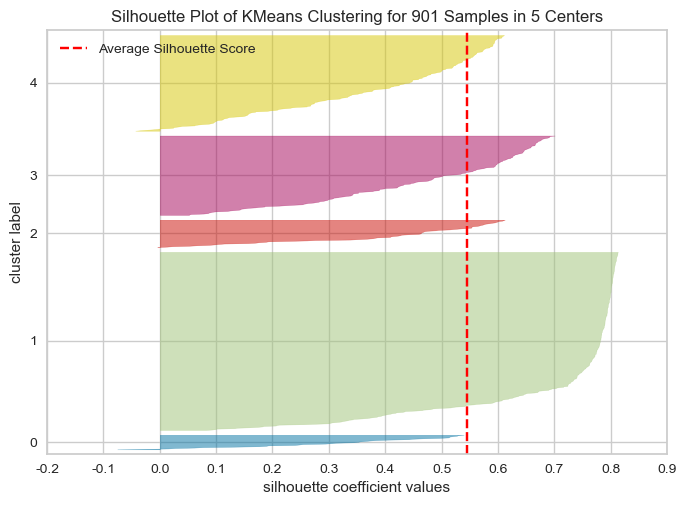

SilhouetteVisualizer(ax=<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 901 Samples in 5 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>,
                     colors='yellowbrick', estimator=KMeans(n_clusters=5))

In [18]:
silhouette_visualizer(kmeans, X, colors='yellowbrick')

In [19]:
df_0 = df[df['cluster']==0]
df_1 = df[df['cluster']==1]
df_2 = df[df['cluster']==2]
df_3 = df[df['cluster']==3]
df_4 = df[df['cluster']==4]

column_means0 = df_0.mean(axis=0)
column_means1 = df_1.mean(axis=0)
column_means2 = df_2.mean(axis=0)
column_means3 = df_3.mean(axis=0)
column_means4 = df_4.mean(axis=0)

df_means = pd.DataFrame([column_means0, column_means1, column_means2, column_means3, column_means4])
df_means

,food_500,convenience_500,hospital_500,sports_500,tour_500,restroom_500,culture_500,cluster
0,559.382353,28.705882,366.117647,44.411765,16.323529,5.117647,4.617647,0.0
1,40.656790,5.629630,23.204938,8.659259,0.456790,3.335802,0.162963,1.0
2,752.476190,42.507937,177.666667,55.650794,22.412698,8.095238,2.968254,2.0
3,485.331492,33.519337,124.093923,47.116022,13.143646,5.734807,2.165746,3.0
4,197.197248,18.435780,73.559633,32.610092,4.197248,4.802752,1.110092,4.0


In [20]:
df_0 = df[df['cluster']==0]
df_1 = df[df['cluster']==1]
df_2 = df[df['cluster']==2]
df_3 = df[df['cluster']==3]
df_4 = df[df['cluster']==4]

column_means0 = df_0.median(axis=0)
column_means1 = df_1.median(axis=0)
column_means2 = df_2.median(axis=0)
column_means3 = df_3.median(axis=0)
column_means4 = df_4.median(axis=0)

df_means = pd.DataFrame([column_means0, column_means1, column_means2, column_means3, column_means4])
df_means

,food_500,convenience_500,hospital_500,sports_500,tour_500,restroom_500,culture_500,cluster
0,587.0,29.0,364.5,45.5,16.0,5.0,5.0,0.0
1,39.0,5.0,18.0,7.0,0.0,3.0,0.0,1.0
2,731.0,44.0,173.0,51.0,18.0,8.0,3.0,2.0
3,492.0,34.0,119.0,47.0,10.0,6.0,2.0,3.0
4,184.5,17.0,59.0,31.0,3.0,5.0,1.0,4.0


평균값과 중위값을 기준으로 밀집도가 높은 클러스터를 찾으면 4 > 1 > 3 > 0 > 2 순인것 같다.

In [21]:
data_500['cluster'] = df['cluster']
data_500.head()

,lat,lng,food_500,convenience_500,hospital_500,sports_500,tour_500,restroom_500,culture_500,cluster
0,37.510895,127.065087,231,21,39,22,10,7,3,4
1,37.488063,127.086883,104,9,53,14,1,4,1,1
2,37.498358,127.047600,207,22,124,47,0,5,1,4
3,37.488282,127.049501,99,13,58,23,1,3,1,1
4,37.499430,127.075837,5,3,4,4,0,5,0,1


In [22]:
# cluster 기준으로 밀집도 레벨

def cluTolevel(df):
    lev = []
    for idx, row in df.iterrows():
        if row['cluster'] == 4:
            lev.append(4)
        if row['cluster'] == 1:
            lev.append(3)
        if row['cluster'] == 3:
            lev.append(2)
        if row['cluster'] == 0:
            lev.append(1)
        if row['cluster'] == 2:
            lev.append(0)
    return lev

level = cluTolevel(data_500)

In [23]:
data_500['level'] = level
data_500.head()

,lat,lng,food_500,convenience_500,hospital_500,sports_500,tour_500,restroom_500,culture_500,cluster,level
0,37.510895,127.065087,231,21,39,22,10,7,3,4,4
1,37.488063,127.086883,104,9,53,14,1,4,1,1,3
2,37.498358,127.047600,207,22,124,47,0,5,1,4,4
3,37.488282,127.049501,99,13,58,23,1,3,1,1,3
4,37.499430,127.075837,5,3,4,4,0,5,0,1,3


In [24]:
import folium
import json
from folium import Marker
geo_path = '../data/서울_자치구_경계_2017.geojson'
geo_str = json.load(open(geo_path, encoding='utf-8'))

def color_select(row):
    level = row.level
    if level == 4:
        return '#e87272' #빨 가장 밀도가 높음
    elif level == 3:
        return '#e8a372' #주
    elif level == 2:
        return '#e8dc72' #노
    elif level == 1:
        return '#37874a' #초
    elif level == 0:
        return '#6c99d9' #파 가장 밀도가 적음

m = folium.Map(location=[37.4966, 127.0628], zoom_start=13)
m.choropleth(geo_data=geo_str, fill_color='#bdbbbb')

for idx, row in data_500.iterrows():
    folium.Circle(
        location=[row['lat'], row['lng']],
        radius=50,
        color=color_select(row),
        fill_color=color_select(row)
    ).add_to(m)
    
m

c:\Users\Leeminji\miniconda3\envs\ds_study\lib\site-packages\folium\folium.py:465: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  warnings.warn(


편의점 기준으로 했을떄보다 강남구 아랫부분이(산부분도 포함) 많아 입지레벨이 낮은부분(파란색)이 많이 보인다.

In [25]:
level_counts = data_500['level'].value_counts()
print(level_counts)

3    405
4    218
2    181
0     63
1     34
Name: level, dtype: int64


비지도 학습한것을 학습이 잘됬는지 지도학습으로 정확도 계산

In [26]:
X = data_500[['food_500', 'convenience_500', 'hospital_500', 'sports_500', 'tour_500', 'restroom_500', 'culture_500']]
y = data_500['cluster']

In [27]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size=0.2,
                                                    random_state=13)

In [28]:
X_train.shape, X_test.shape

((720, 7), (181, 7))

In [29]:
from sklearn.tree import DecisionTreeClassifier

DC = DecisionTreeClassifier(max_depth=5, random_state=13)
DC.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=5, random_state=13)

In [30]:
from sklearn.metrics import accuracy_score

pred = DC.predict(X_test)
accuracy_score(y_test, pred)

0.9447513812154696

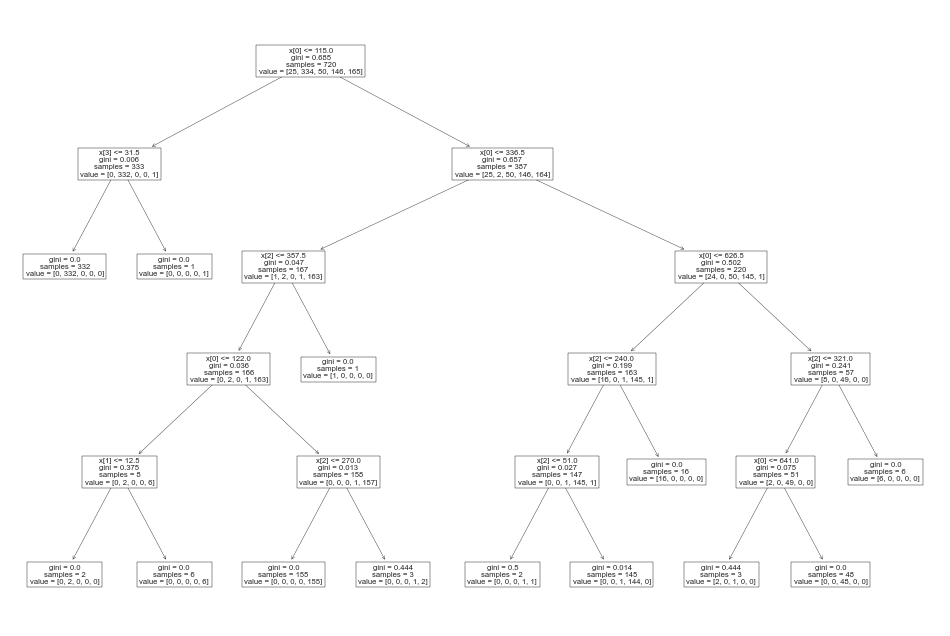

In [31]:
from sklearn.tree import plot_tree

plt.figure(figsize=(12,8))
plot_tree(DC);

정확도 97%로 높은 수준으로 비지도학습이 잘된것으로 보인다. 

특정 위치를 넣으면 입지레벨이 나오는 코드

In [143]:
lat_range = generate_random_numbers(37.45901355607214, 37.53719881898076, 30)
lng_range = generate_random_numbers(127.0088013935976, 127.12288623841854, 30)
test = pd.DataFrame({'lat': lat_range, 'lng':lng_range})

test['inside'] = test.apply(lambda x: polygon.contains(Point(x['lng'], x['lat'])), axis=1)
test = test[test['inside']==True]

In [144]:
r_within = []

# 강남구 랜덤 좌표
for i, r in test.iterrows():
    r_with = []
    c = (r['lat'], r['lng'])
    r_with.append(r['lat'])
    r_with.append(r['lng'])
    
    for lis in lists:
        count = 0 
        for idx, r in lis.iterrows():
            lat = r['lat']
            lng = r['lng']
            sub = (lat, lng)
        
            if haversine(c, sub, unit='m') < 500:
                count += 1
        r_with.append(count)        
    r_within.append(r_with)

In [145]:
cols = ['lat', 'lng', 'food_500', 'convenience_500', 'hospital_500', 'sports_500', 'tour_500', 'restroom_500', 'culture_500']
r_df = pd.DataFrame(r_within, columns=cols)
r_df

,lat,lng,food_500,convenience_500,hospital_500,sports_500,tour_500,restroom_500,culture_500
0,37.505375,127.062391,377,28,83,37,10,5,2
1,37.531082,127.038019,198,9,68,21,1,4,0
2,37.511674,127.044916,239,24,62,32,12,4,3
3,37.488213,127.069978,43,5,35,17,0,8,0
4,37.499685,127.064474,180,21,73,45,0,2,2
5,37.463285,127.117270,0,0,0,0,0,2,0
6,37.525128,127.047894,426,19,105,46,8,4,2


In [146]:
X = r_df[['food_500', 'convenience_500', 'hospital_500', 'sports_500', 'tour_500', 'restroom_500', 'culture_500']]

In [147]:
predict = pd.DataFrame(kmeans.predict(X), columns=['cluster'])
r_df = pd.concat([r_df, predict], axis=1)
level = cluTolevel(r_df)
r_df['level'] = level
r_df

,lat,lng,food_500,convenience_500,hospital_500,sports_500,tour_500,restroom_500,culture_500,cluster,level
0,37.505375,127.062391,377,28,83,37,10,5,2,3,2
1,37.531082,127.038019,198,9,68,21,1,4,0,0,1
2,37.511674,127.044916,239,24,62,32,12,4,3,0,1
3,37.488213,127.069978,43,5,35,17,0,8,0,2,0
4,37.499685,127.064474,180,21,73,45,0,2,2,0,1
5,37.463285,127.117270,0,0,0,0,0,2,0,2,0
6,37.525128,127.047894,426,19,105,46,8,4,2,3,2


In [148]:
import folium
import json
from folium import Marker
geo_path = '../data/서울_자치구_경계_2017.geojson'
geo_str = json.load(open(geo_path, encoding='utf-8'))

def c_color_select(row):
    level = row.level
    if level == 4:
        return '#e87272' #빨 가장 밀도가 높음
    elif level == 3:
        return '#e8a372' #주
    elif level == 2:
        return '#e8dc72' #노
    elif level == 1:
        return '#37874a' #초
    elif level == 0:
        return '#6c99d9' #파 가장 밀도가 적음
    
def m_color_select(row):
    level = row.level
    if level == 4:
        return 'red' #빨 가장 밀도가 높음
    elif level == 3:
        return 'orange' #주
    elif level == 2:
        return 'beige' #노
    elif level == 1:
        return 'green' #초
    elif level == 0:
        return 'blue' #파 가장 밀도가 적음

In [149]:
m = folium.Map(location=[37.4966, 127.0628], zoom_start=13)
m.choropleth(geo_data=geo_str, fill_color='#bdbbbb')

for idx, row in data_500.iterrows():
    folium.Circle(
        location=[row['lat'], row['lng']],
        radius=50,
        color=color_select(row),
        fill_color=c_color_select(row)
    ).add_to(m)

for idx, row in r_df.iterrows():
    folium.Marker(location=[row['lat'], row['lng']], 
              popup='random',
               icon=folium.Icon(color=m_color_select(row),
                                icon = 'flag')).add_to(m)
    
m

c:\Users\Leeminji\miniconda3\envs\ds_study\lib\site-packages\folium\folium.py:465: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  warnings.warn(


특정 좌표의 반경에 음식점, 편의점, 병원, 스포츠 시설 시각화

In [150]:
# 강남구 랜덤 좌표를 넣으면 반경 500 이내의 시설들의 위경도를 가져오는 함수
def facilityTo500(df):
    lis = []
    l = []
    for i, r in test.iterrows():
        c = (r['lat'], r['lng'])

        for idx, r in df.iterrows():
            lat = r['lat']
            lng = r['lng']
            sub = (lat, lng)

            if haversine(c, sub, unit='m') < 500:
                l = []
                l.append(lat)
                l.append(lng)
                lis.append(l)
            
    return lis

In [151]:
food_500 = facilityTo500(food)
convenience_500 = facilityTo500(convenience)
hospital_500 = facilityTo500(hospital)
sports_500 = facilityTo500(sports)
tour_500 = facilityTo500(tour)
restroom_500 = facilityTo500(restroom)
culture_500 = facilityTo500(culture)

In [152]:
# 음식점 빨강, 편의점 주황, 병원 노랑, 스포츠 초록, 여행 파랑, 화장실 파랑, 문화 파랑로 시각화
def m_color(idx):
    if idx == 0:
        return '#e87272' #빨
    elif idx == 1:
        return '#e8a372' #주
    elif idx == 2:
        return '#e8dc72' #노
    elif idx == 3:
        return '#37874a' #초
    elif idx == 4:
        return '#6c99d9' #파
    elif idx == 5:
        return '#6c99d9' #파
    elif idx == 6:
        return '#6c99d9' #파

lists = [food_500, convenience_500, hospital_500, sports_500, tour_500, restroom_500, culture_500]

In [153]:
m = folium.Map(location=[37.4966, 127.0628], zoom_start=13)
m.choropleth(geo_data=geo_str, fill_color='#bdbbbb')

for idx, lis in enumerate(lists):
    for row in lis:
        folium.Circle(
            location=[row[0], row[1]],
            radius=10,
            color=m_color(idx)  # idx에 따라 원형 마커 색상 선택
        ).add_to(m)  

for idx, row in r_df.iterrows():
    folium.Marker(location=[row['lat'], row['lng']], 
              popup='random',
               icon=folium.Icon(color=m_color_select(row))).add_to(m)
    
m

지하철역 기준으로 반경 500m시설 시각화

In [163]:
# 강남구 지하철 좌표를 넣으면 반경 500m 이내의 시설들의 위경도를 가져오는 함수
def facilityTo500(df):
    low = []
    l = []
    for i, r in subway.iterrows():
        c = (r['lat'], r['lng'])

        for idx, r in df.iterrows():
            lat = r['lat']
            lng = r['lng']
            sub = (lat, lng)

            if haversine(c, sub, unit='m') < 500:
                l = []
                l.append(lat)
                l.append(lng)
                low.append(l)
            
    return low

In [164]:
lists = [food, convenience, hospital, sports, tour, restroom, culture]

In [165]:
r_within = []

# 강남구 지하철 좌표
for i, r in subway.iterrows():
    r_with = []
    c = (r['lat'], r['lng'])
    r_with.append(r['lat'])
    r_with.append(r['lng'])
    
    for lis in lists:
        count = 0 
        for idx, row in lis.iterrows():
            lat = row['lat']
            lng = row['lng']
            sub = (lat, lng)
        
            if haversine(c, sub, unit='m') < 500:
                count += 1
        r_with.append(count)
    print(r_with)        
    r_within.append(r_with)

[37.508844, 127.06316, 371, 27, 105, 23, 12, 9, 4]
[37.504856, 127.048807, 625, 47, 168, 55, 18, 5, 2]
[37.500622, 127.036456, 763, 61, 138, 80, 54, 10, 2]
[37.496837, 127.028104, 521, 37, 252, 36, 10, 7, 2]
[37.527072, 127.028461, 379, 22, 462, 43, 8, 5, 5]
[37.516334, 127.020114, 464, 23, 258, 23, 15, 5, 5]
[37.486947, 127.046769, 186, 14, 50, 27, 1, 5, 2]
[37.491224, 127.055186, 75, 8, 51, 14, 0, 5, 0]
[37.494612, 127.063642, 129, 16, 104, 25, 0, 2, 1]
[37.496663, 127.070594, 61, 10, 27, 15, 1, 7, 0]
[37.493514, 127.079532, 91, 13, 68, 25, 2, 7, 0]
[37.483681, 127.08439, 21, 7, 31, 8, 0, 4, 1]
[37.487472, 127.101422, 139, 11, 54, 19, 0, 7, 0]
[37.519365, 127.05335, 151, 20, 89, 31, 6, 5, 0]
[37.517179, 127.041255, 372, 23, 157, 53, 4, 6, 0]
[37.514229, 127.031656, 368, 34, 86, 48, 10, 6, 4]
[37.511093, 127.021415, 337, 19, 114, 22, 7, 2, 1]
[37.507287, 127.033868, 453, 40, 76, 47, 19, 6, 1]
[37.510297, 127.043999, 233, 26, 54, 30, 12, 4, 3]
[37.513011, 127.053282, 347, 30, 66, 37, 8

In [166]:
cols = ['lat', 'lng', 'food_500', 'convenience_500', 'hospital_500', 'sports_500', 'tour_500', 'restroom_500', 'culture_500']
r_df = pd.DataFrame(r_within, columns=cols)

X = r_df[['food_500', 'convenience_500', 'hospital_500', 'sports_500', 'tour_500', 'restroom_500', 'culture_500']]

predict = pd.DataFrame(kmeans.predict(X), columns=['cluster'])
r_df = pd.concat([r_df, predict], axis=1)
level = cluTolevel(r_df)
r_df['level'] = level
r_df

,lat,lng,food_500,convenience_500,hospital_500,sports_500,tour_500,restroom_500,culture_500,cluster,level
0,37.508844,127.063160,371,27,105,23,12,9,4,3,2
1,37.504856,127.048807,625,47,168,55,18,5,2,1,3
2,37.500622,127.036456,763,61,138,80,54,10,2,1,3
3,37.496837,127.028104,521,37,252,36,10,7,2,1,3
4,37.527072,127.028461,379,22,462,43,8,5,5,3,2
5,37.516334,127.020114,464,23,258,23,15,5,5,3,2
6,37.486947,127.046769,186,14,50,27,1,5,2,0,1
7,37.491224,127.055186,75,8,51,14,0,5,0,2,0
8,37.494612,127.063642,129,16,104,25,0,2,1,0,1
9,37.496663,127.070594,61,10,27,15,1,7,0,2,0


In [172]:
level

[2, 3, 3, 3, 2, 2, 1, 0, 1, 0, 0, 0, 1, 1, 2, 2, 2, 2, 1, 2, 1]

In [167]:
food_500 = facilityTo500(food)
convenience_500 = facilityTo500(convenience)
hospital_500 = facilityTo500(hospital)
sports_500 = facilityTo500(sports)
tour_500 = facilityTo500(tour)
restroom_500 = facilityTo500(restroom)
culture_500 = facilityTo500(culture)

In [168]:
# 음식점 빨강, 편의점 파랑, 병원 초록, 스포츠 초록, 여행 파랑, 화장실 보라, 문화 보라로 시각화
def m_color(idx):
    if idx == 0:
        return '#e87272' #빨
    elif idx == 1:
        return '#e8a372' #주
    elif idx == 2:
        return '#e8dc72' #노
    elif idx == 3:
        return '#37874a' #초
    elif idx == 4:
        return '#6c99d9' #파
    elif idx == 5:
        return '#6c99d9' #파
    elif idx == 6:
        return '#6c99d9' #파

lists = [food_500, convenience_500, hospital_500, sports_500, tour_500, restroom_500, culture_500]

In [169]:
m = folium.Map(location=[37.4966, 127.0628], zoom_start=13)
m.choropleth(geo_data=geo_str, fill_color='#bdbbbb')

for idx, lis in enumerate(lists):
    for row in lis:
        folium.Circle(
            location=[row[0], row[1]],
            radius=10,
            color=m_color(idx)  # idx에 따라 원형 마커 색상 선택
        ).add_to(m)  

for idx, row in r_df.iterrows():
    folium.Marker(location=[row['lat'], row['lng']], 
              popup='random',
               icon=folium.Icon(color=m_color_select(row))).add_to(m)
    
m

c:\Users\Leeminji\miniconda3\envs\ds_study\lib\site-packages\folium\folium.py:465: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  warnings.warn(
